#HW1 - Data Exploration and Preparation

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Loading the dataset

In [2]:
# !rm *.csv

# from google.colab import files
# print("Please load the raw csv data")
# uploadedData = files.upload()
# filename = list(uploadedData)[0]

In [3]:
filename = 'virus_data.csv'
dataset = pd.read_csv(filename)

In [4]:
dataset.shape

(1250, 26)

In [5]:
print(dataset['sport_activity'].value_counts())
value_counts = dataset['conversations_per_day'].value_counts()
df_value_counts = pd.DataFrame({'Conversations per Day': value_counts.index, 'Count': value_counts.values})
print(df_value_counts)


1    481
0    360
2    241
3    111
4     29
5     28
Name: sport_activity, dtype: int64
    Conversations per Day  Count
0                       3    224
1                       2    215
2                       4    190
3                       5    156
4                       6    111
5                       1    104
6                       8     72
7                       7     60
8                       9     39
9                      10     23
10                     11     19
11                     12     12
12                     13      9
13                     14      6
14                     17      4
15                     15      2
16                     16      2
17                     19      1
18                     22      1


In [6]:
from sklearn.model_selection import train_test_split

# Set the random state based on the sum of the last two digits of your IDs
random_state = sum([51, 17])  # Replace [1, 2, 3] with your actual IDs

# Split the data into training set and test set
train_set, test_set = train_test_split(dataset, test_size=0.2, random_state=random_state)


In [7]:
train_set.shape, test_set.shape 

((1000, 26), (250, 26))

C:\Users\Dell\AppData\Local\Temp\ipykernel_42228\3583067713.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_set_selected['spread'] = train_set['spread']


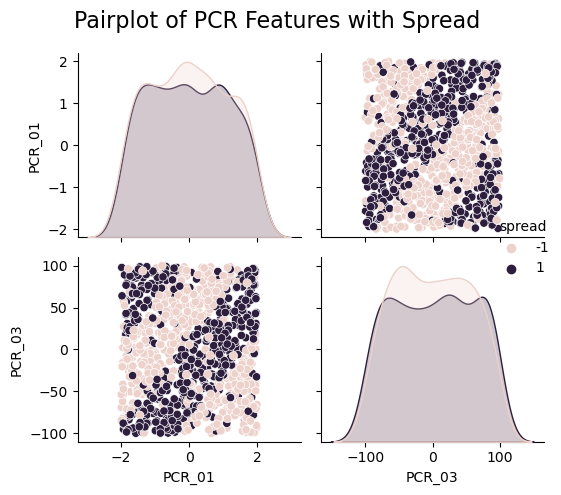

          PCR_01    PCR_03    spread
PCR_01  1.000000 -0.008981 -0.000442
PCR_03 -0.008981  1.000000  0.015187
spread -0.000442  0.015187  1.000000


In [8]:
import seaborn as sns

# Select the PCR features for the pairplot
features = ['PCR_01', 'PCR_03']

# Create a new dataframe with only the selected features from the train_set
train_set_selected = train_set[features]

# Add the 'spread' column to the train_set_selected dataframe
train_set_selected['spread'] = train_set['spread']

# Create the pairplot
sns.pairplot(train_set_selected, hue='spread')

# Add titles, grid lines, and axis labels
plt.suptitle('Pairplot of PCR Features with Spread', fontsize=16)
plt.grid(True)
plt.tight_layout()

# Show the plot
plt.show()

correlation = train_set_selected[['PCR_01', 'PCR_03', 'spread']].corr()
print(correlation)



In [9]:
from sklearn.base import BaseEstimator,ClassifierMixin
from scipy.spatial.distance import cdist
class kNN(BaseEstimator, ClassifierMixin):
    def __init__(self, n_neighbors:int = 3):
        self.n_neighbors = n_neighbors
        self.X_train = None
        self.y_train = None

    def fit(self, X, y):
        self.X_train = np.copy(X)
        self.y_train = np.copy(y)
        return self

    def predict(self, X):
        distances = cdist(X, self.X_train)
        indices = np.argpartition(distances, self.n_neighbors, axis=1)[:, :self.n_neighbors]
        neighbors_labels = self.y_train[indices]
        predictions = np.sign(np.sum(neighbors_labels, axis=1))
        return predictions

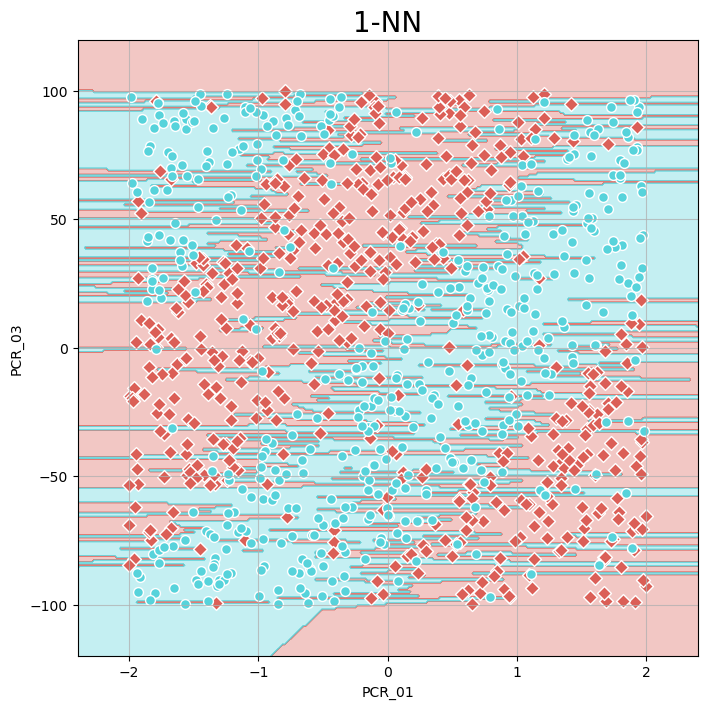

(1.0, 0.7)

In [10]:
import matplotlib.pyplot as plt
# from visualize_clf import visualize_clf

def visualize_clf(clf, X, Y, title, 
                  xlabel, ylabel,
                  maxlabelrker_size=50,
                  grid_length=300,
                  linewidths=None):
    import matplotlib.pyplot as plt
    import pandas as pd
    from matplotlib.colors import ListedColormap
    import numpy as np
    import seaborn as sns
    
    if isinstance(X, pd.DataFrame):
        X = X.to_numpy()
        
    # For internal use here, make sure labels are 0 and 1
    Y = np.ravel(Y).astype(int)
    labels = set(Y)
    assert len(labels) == 2, "Can only visualize two unique labels"

    if labels == set([-1,1]):
      Y = (Y + 1) // 2
      labels = set(Y)
    
    assert labels == set([0,1]), "Could not handle given labels"

    plt.figure(figsize=(8, 8))

    # Parameters
    n_classes = 2
    markers = ["D", "o"]
    palette = sns.color_palette("hls", 2)
    custom_cmap = ListedColormap(palette.as_hex())

    x_delta = np.abs(X[:, 0].max() - X[:, 0].min()) * 0.1
    y_delta = np.abs(X[:, 1].max() - X[:, 1].min()) * 0.1
    x_min, x_max = X[:, 0].min() - x_delta, X[:, 0].max() + x_delta
    y_min, y_max = X[:, 1].min() - y_delta, X[:, 1].max() + y_delta
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, grid_length),
                         np.linspace(y_min, y_max, grid_length))
    plt.tight_layout(h_pad=0.5, w_pad=0.5, pad=2.5)

    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    cs = plt.contourf(xx, yy, Z, cmap=custom_cmap, alpha=0.35)

    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.grid(alpha=0.75)

    # Plot the training points
    for i, color, marker in zip(labels, palette, markers):
        idx = np.where(Y == i)
        plt.scatter(X[idx, 0], X[idx, 1], color=color,
                    marker=marker,
                    edgecolor='white', s=maxlabelrker_size,
                    linewidths=linewidths)

    plt.title(title, fontsize=20)
    plt.axis("tight")
    plt.show()
   

# Create a temporary DataFrame with only the two features PCR_01 and PCR_03 from the training set
temp_df = train_set[['PCR_01', 'PCR_03']].copy()

# Create the 1-NN model
knn_model = kNN(n_neighbors=1)

# Fit the model on the temporary DataFrame
knn_model.fit(temp_df, train_set['spread'])

# # Define the visualize_clf function
# def visualize_clf(model, X, y):
#     h = 0.02  # step size in the mesh
#     x_min, x_max = X.iloc[:, 0].min() - 1, X.iloc[:, 0].max() + 1
#     y_min, y_max = X.iloc[:, 1].min() - 1, X.iloc[:, 1].max() + 1
#     xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
#                          np.arange(y_min, y_max, h))
#     Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
#     Z = Z.reshape(xx.shape)
#     plt.figure(figsize=(10, 8))
#     plt.contourf(xx, yy, Z, alpha=0.8)
#     plt.scatter(X.iloc[:, 0], X.iloc[:, 1], c=y, edgecolors='k')
#     plt.xlabel('PCR_01')
#     plt.ylabel('PCR_03')
#     plt.title('Decision Regions')
#     plt.show()

# Call the visualize_clf function with the training set
visualize_clf(knn_model, temp_df, train_set['spread'], "1-NN", "PCR_01", "PCR_03")

# Compute the training accuracy
train_accuracy = knn_model.score(temp_df, train_set['spread'])

# Compute the test accuracy
test_accuracy = knn_model.score(test_set[['PCR_01', 'PCR_03']], test_set['spread'])

train_accuracy, test_accuracy


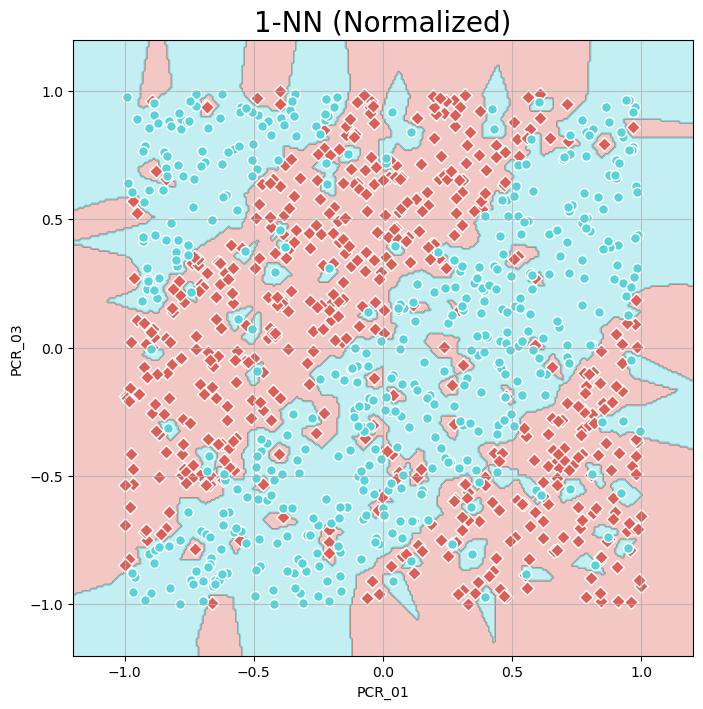

(1.0, 0.796)

In [11]:
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler object
scaler = MinMaxScaler(feature_range=(-1, 1))

# Normalize the features in the temporary DataFrame
normalized_df = scaler.fit_transform(temp_df)

# Create a new DataFrame with the normalized features
normalized_temp_df = pd.DataFrame(normalized_df, columns=temp_df.columns)

# Train a new kNN model on the normalized dataset
knn_model_normalized = kNN(n_neighbors=1)
knn_model_normalized.fit(normalized_temp_df, train_set['spread'])

# Compute the new training accuracy
normalized_train_accuracy = knn_model_normalized.score(normalized_temp_df, train_set['spread'])

# Compute the new test accuracy
normalized_test_accuracy = knn_model_normalized.score(scaler.transform(test_set[['PCR_01', 'PCR_03']]), test_set['spread'])

# Draw the decision regions of the model
visualize_clf(knn_model_normalized, normalized_temp_df, train_set['spread'], "1-NN (Normalized)", "PCR_01", "PCR_03")

normalized_train_accuracy, normalized_test_accuracy


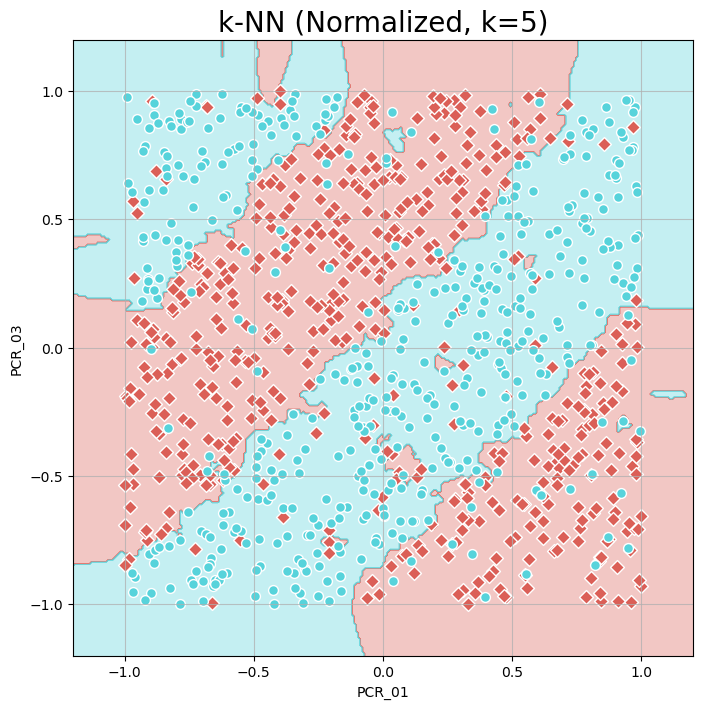

(0.885, 0.844)

In [12]:
# Train a new kNN model on the normalized dataset with k = 5
knn_model_normalized_k5 = kNN(n_neighbors=5)
knn_model_normalized_k5.fit(normalized_temp_df, train_set['spread'])

# Compute the new training accuracy with k = 5
normalized_train_accuracy_k5 = knn_model_normalized_k5.score(normalized_temp_df, train_set['spread'])

# Compute the new test accuracy with k = 5
normalized_test_accuracy_k5 = knn_model_normalized_k5.score(scaler.transform(test_set[['PCR_01', 'PCR_03']]), test_set['spread'])

# Draw the decision regions of the model with k = 5
visualize_clf(knn_model_normalized_k5, normalized_temp_df, train_set['spread'], "k-NN (Normalized, k=5)", "PCR_01", "PCR_03")

normalized_train_accuracy_k5, normalized_test_accuracy_k5


In [13]:
# Create the SpecialProperty feature
dataset['SpecialProperty'] = dataset['blood_type'].isin(['O+', 'B+']) * 2 - 1

# Remove the original blood_type feature
dataset.drop('blood_type', axis=1, inplace=True)

In [14]:
symptoms_set = set(dataset['symptoms'].str.split(';').explode()) - {np.nan}
print(symptoms_set)


# Create a new column for each symptom
for symptom in symptoms_set:
    dataset[symptom] = dataset['symptoms'].str.contains(symptom, regex=False)
dataset["No Symptoms"] = dataset["symptoms"].isna()

# convert each NaN value to False
dataset = dataset.fillna(False)

symptoms_set = list(symptoms_set) + ["No Symptoms"]
# convert the True/False values to 1/-1
for symptom in symptoms_set:
    dataset[symptom] = dataset[symptom] * 2 - 1

# Remove the original symptoms feature
dataset.drop('symptoms', axis=1, inplace=True)

{'cough', 'shortness_of_breath', 'smell_loss', 'sore_throat', 'fever'}


In [15]:
# Convert the 'sex' feature to 1/-1
dataset['sex'] = dataset['sex'].map({'M': 1, 'F': -1})

# remove the columns that are not needed
dataset.drop("pcr_date", axis=1, inplace=True)
dataset.drop("current_location", axis=1, inplace=True)

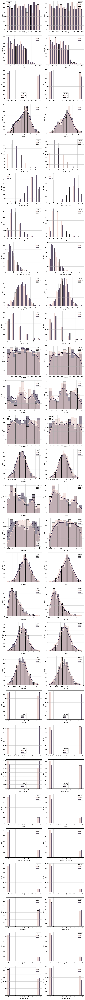

In [16]:
COL_NAME = dataset.columns
COLS, ROWS = (2, len(COL_NAME))
plt.figure(figsize=(5 * COLS, 4 * ROWS))
for row in range(ROWS):
    column = COL_NAME[row]
    for j, cls in enumerate(["risk", "spread"]):
        plt.subplot(ROWS,COLS, row * COLS + 1 + j)
        isContinuous = "float" in dataset[column].dtype.name
        sns.histplot(data=dataset, x=column, hue=cls, line_kws={"linewidth": 3},
        kde=isContinuous, multiple="layer" if isContinuous else "dodge")
        plt.grid(alpha=0.5)
plt.tight_layout()

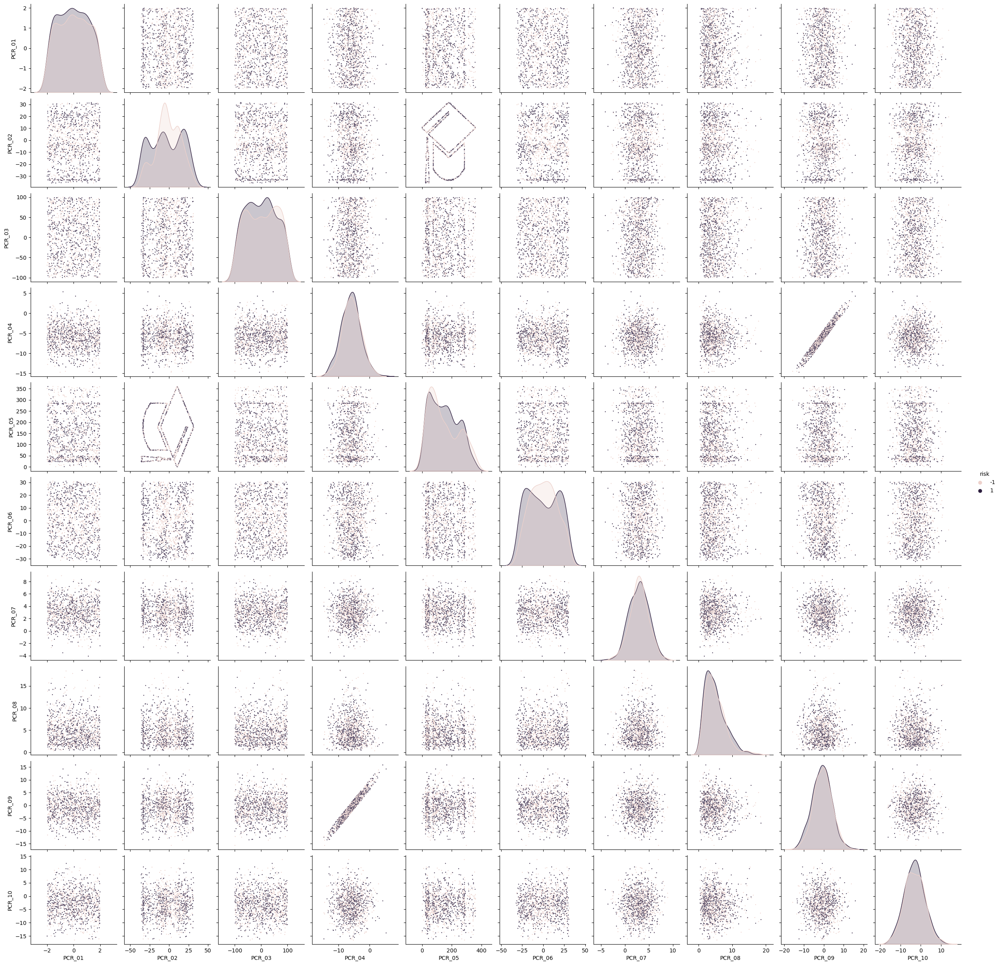

In [17]:
sns.pairplot(dataset[dataset.filter(like='PCR').columns.tolist() + ["risk"]],
plot_kws={"s": 3}, hue="risk")

In [18]:
print(dataset.columns)

Index(['patient_id', 'age', 'sex', 'weight', 'num_of_siblings',
       'happiness_score', 'household_income', 'conversations_per_day',
       'sugar_levels', 'sport_activity', 'PCR_01', 'PCR_02', 'PCR_03',
       'PCR_04', 'PCR_05', 'PCR_06', 'PCR_07', 'PCR_08', 'PCR_09', 'PCR_10',
       'spread', 'risk', 'SpecialProperty', 'cough', 'shortness_of_breath',
       'smell_loss', 'sore_throat', 'fever', 'No Symptoms'],
      dtype='object')


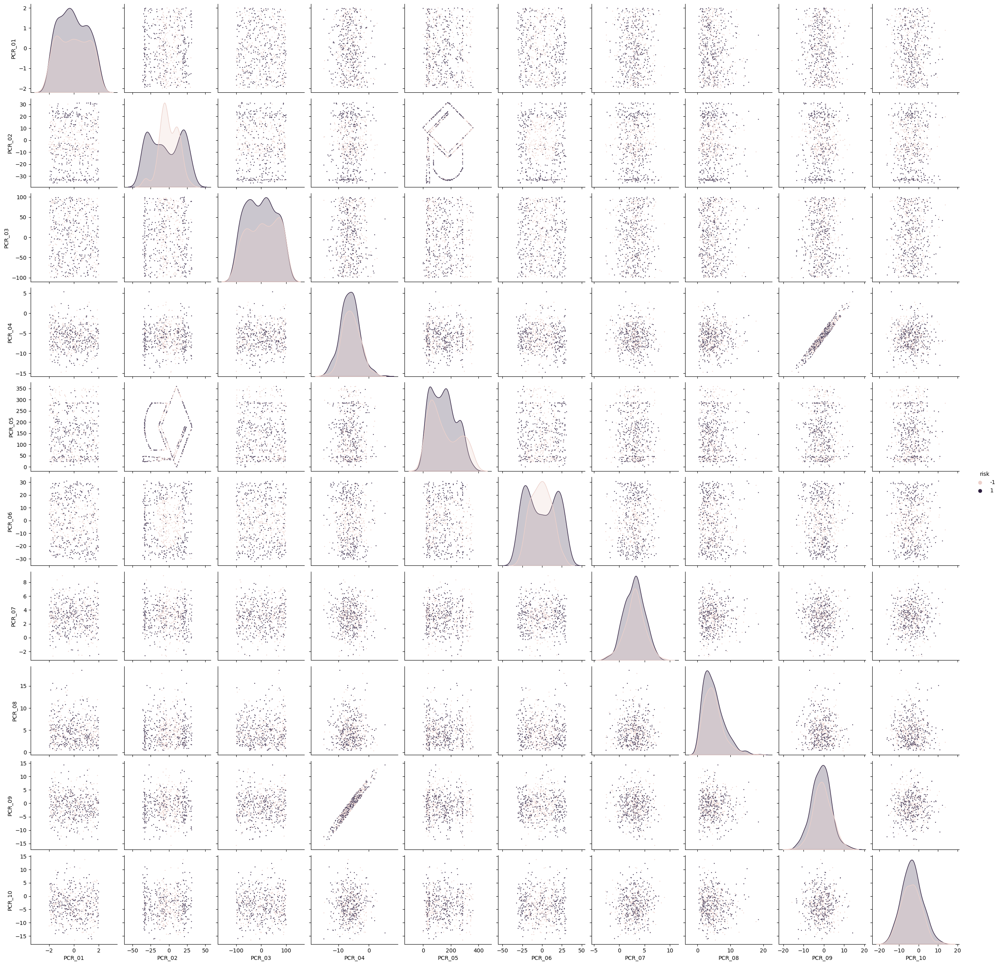

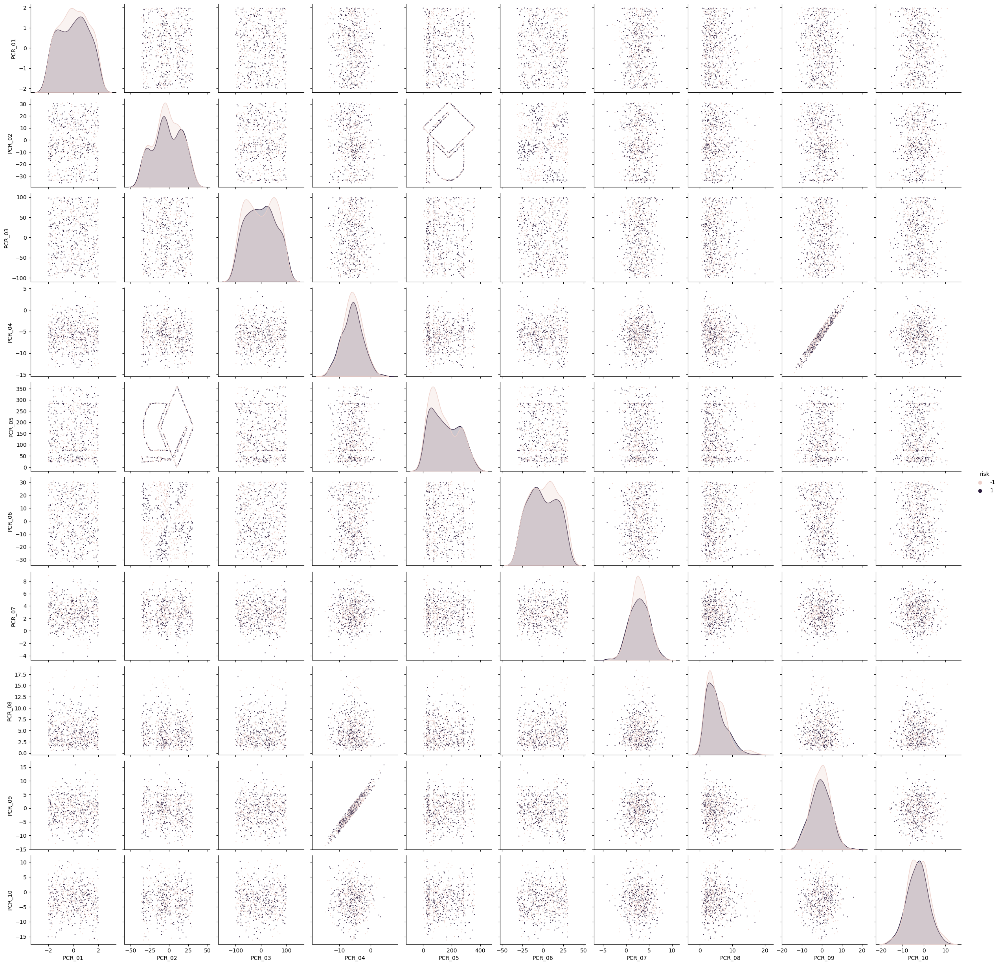

In [19]:
# Split the data based on the SpecialProperty feature
special_property_positive = dataset[dataset['SpecialProperty'] == 1]
special_property_negative = dataset[dataset['SpecialProperty'] == -1]

sns.pairplot(special_property_positive[special_property_positive.filter(like='PCR').columns.tolist() + ["risk"]], plot_kws={"s": 3}, hue="risk")
sns.pairplot(special_property_negative[special_property_negative.filter(like='PCR').columns.tolist() + ["risk"]], plot_kws={"s": 3}, hue="risk")



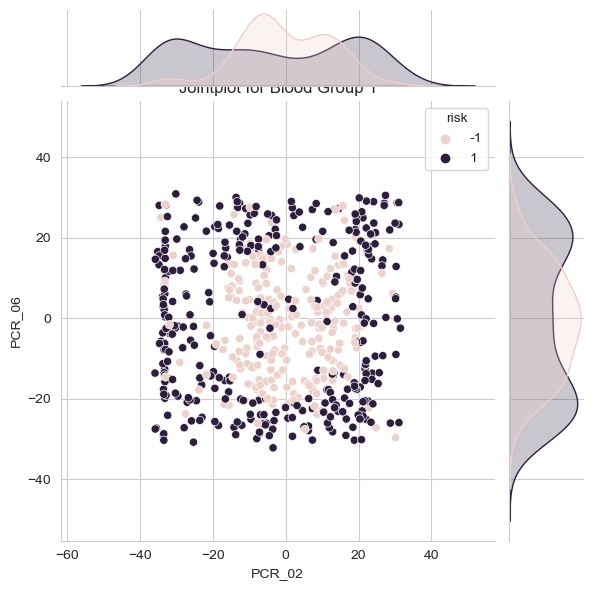

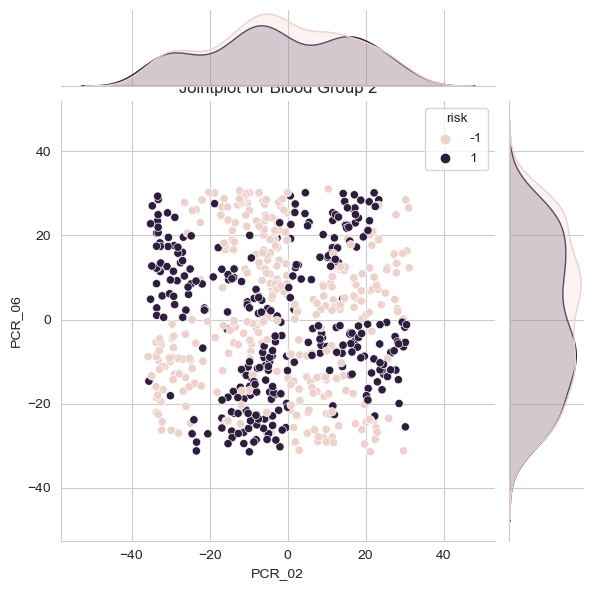

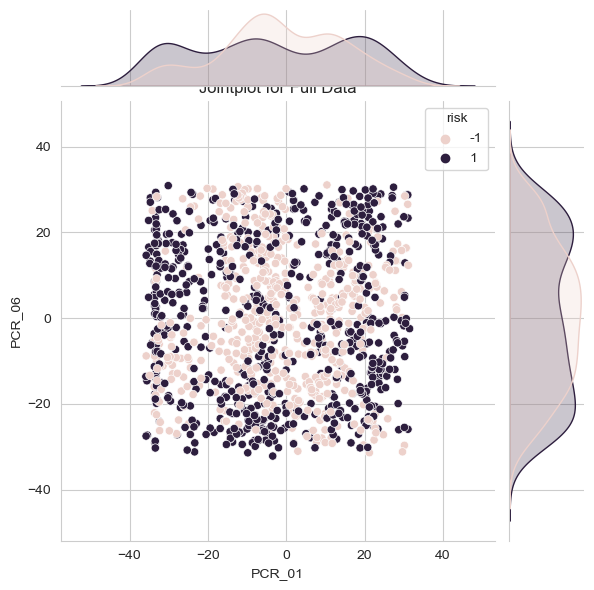

In [20]:
import seaborn as sns

# Jointplot for the first blood group (O+ and B+)
blood_group_1 = dataset[dataset['SpecialProperty'] == 1]
sns.set_style("whitegrid")
sns.jointplot(data=blood_group_1, x='PCR_02', y='PCR_06', hue='risk', height=6, kind='scatter')
plt.title('Jointplot for Blood Group 1')
plt.xlabel('PCR_02')
plt.ylabel('PCR_06')
plt.show()

# Jointplot for the second blood group (other blood groups)
blood_group_2 = dataset[dataset['SpecialProperty'] == -1]
sns.set_style("whitegrid")
sns.jointplot(data=blood_group_2, x='PCR_02', y='PCR_06', hue='risk', height=6, kind='scatter')
plt.title('Jointplot for Blood Group 2')
plt.xlabel('PCR_02')
plt.ylabel('PCR_06')
plt.show()

# Jointplot for the full data
sns.set_style("whitegrid")
sns.jointplot(data=dataset, x='PCR_02', y='PCR_06', hue='risk', height=6, kind='scatter')
plt.title('Jointplot for Full Data')
plt.xlabel('PCR_01')
plt.ylabel('PCR_06')
plt.show()


In [21]:
def plot3d(df, colX, colY, colZ, title, hue=None, s=1):
  %matplotlib inline

  fig = plt.figure(figsize=(20, 4))
  axes = [fig.add_subplot(1, 4, 1, projection='3d'),
          fig.add_subplot(1, 4, 2, projection='3d'),
          fig.add_subplot(1, 4, 3, projection='3d'),
          fig.add_subplot(1, 4, 4, projection='3d')]

  palette = sns.color_palette("hls", 2)

  for i,ax in enumerate(axes):
    if hue is None:
      ax.scatter3D(df[colX], df[colY], df[colZ], color=palette[0], s=s)
    else:
      idx = df[hue] == True
      df1 = df[idx]
      df2 = df[~idx]

      ax.scatter3D(df1[colX], df1[colY], df1[colZ], color=palette[0], s=s)
      ax.scatter3D(df2[colX], df2[colY], df2[colZ], color=palette[1], s=s)

    if i == 3 or i == 1:
      ax.set_xlabel(colX, labelpad=20)
      ax.set_ylabel(colY, labelpad=20)
    else:
      ax.xaxis.set_ticklabels([])
      ax.yaxis.set_ticklabels([])

    ax.view_init(elev=5., azim=45*i+15)

  axes[1].set_zlabel("\n" + colZ, labelpad=1)

  plt.suptitle(title)
  plt.subplots_adjust(wspace=0.1, top=0.99)
  plt.show()

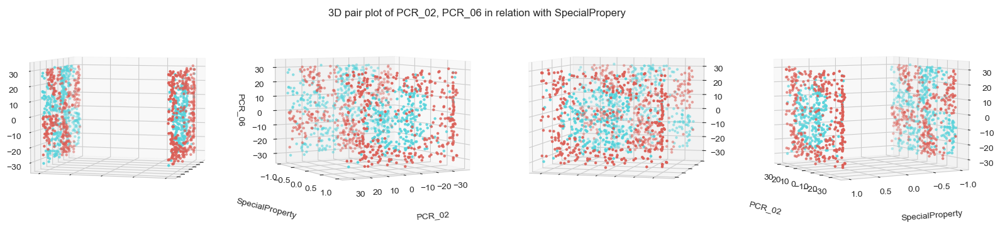

In [22]:
plot3d(dataset, "PCR_02", "SpecialProperty", "PCR_06", title="3D pair plot of PCR_02, PCR_06 in relation with SpecialPropery", hue="risk", s=5)

In [39]:
dataset.columns

Index(['patient_id', 'age', 'sex', 'weight', 'num_of_siblings',
       'happiness_score', 'household_income', 'conversations_per_day',
       'sugar_levels', 'sport_activity', 'PCR_01', 'PCR_02', 'PCR_03',
       'PCR_04', 'PCR_05', 'PCR_06', 'PCR_07', 'PCR_08', 'PCR_09', 'PCR_10',
       'spread', 'risk', 'SpecialProperty', 'cough', 'shortness_of_breath',
       'smell_loss', 'sore_throat', 'fever', 'No Symptoms'],
      dtype='object')

In [41]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Create a StandardScaler object
standard_scaler = StandardScaler()

# Create a MinMaxScaler object
minmax_scaler = MinMaxScaler(feature_range=(-1, 1)      )

# Apply StandardScaler on all features except the columns you want to exclude
columns_to_exclude = ['spread', 'risk', 'SpecialProperty', 'cough', 'shortness_of_breath',
       'smell_loss', 'sore_throat', 'fever', 'No Symptoms', 'sex']
columns_to_scale = [col for col in dataset.columns if col not in columns_to_exclude]
df_standard_scaled = pd.DataFrame(standard_scaler.fit_transform(dataset[columns_to_scale]), columns=columns_to_scale)

# Apply StandardScaler on all features
# df_standard_scaled = pd.DataFrame(standard_scaler.fit_transform(dataset), columns=dataset.columns)

# Apply MinMaxScaler on all features
df_minmax_scaled = pd.DataFrame(minmax_scaler.fit_transform(dataset[columns_to_scale]), columns=columns_to_scale)

# Add the excluded columns to the scaled dataframe
df_standard_scaled = pd.concat([df_standard_scaled, dataset[columns_to_exclude]], axis=1)

# Add the excluded columns to the scaled dataframe
df_minmax_scaled = pd.concat([df_minmax_scaled, dataset[columns_to_exclude]], axis=1)



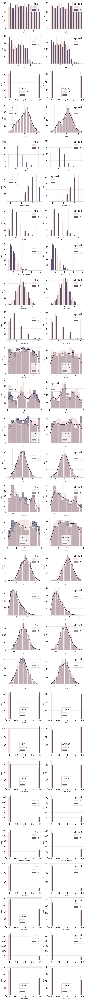

In [44]:
COL_NAME = dataset.columns
COLS, ROWS = (2, len(COL_NAME))
plt.figure(figsize=(5 * COLS, 4 * ROWS))
for row in range(ROWS):
    column = COL_NAME[row]
    for j, cls in enumerate(["risk", "spread"]):
        plt.subplot(ROWS,COLS, row * COLS + 1 + j)
        isContinuous = "float" in dataset[column].dtype.name
        sns.histplot(data=df_standard_scaled, x=column, hue=cls, line_kws={"linewidth": 3},
        kde=isContinuous, multiple="layer" if isContinuous else "dodge")
        plt.grid(alpha=0.5)
plt.tight_layout()

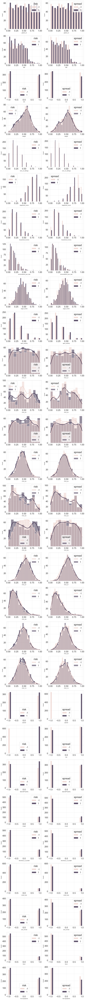

In [45]:
COL_NAME = dataset.columns
COLS, ROWS = (2, len(COL_NAME))
plt.figure(figsize=(5 * COLS, 4 * ROWS))
for row in range(ROWS):
    column = COL_NAME[row]
    for j, cls in enumerate(["risk", "spread"]):
        plt.subplot(ROWS,COLS, row * COLS + 1 + j)
        isContinuous = "float" in dataset[column].dtype.name
        sns.histplot(data=df_minmax_scaled, x=column, hue=cls, line_kws={"linewidth": 3},
        kde=isContinuous, multiple="layer" if isContinuous else "dodge")
        plt.grid(alpha=0.5)
plt.tight_layout()

In [48]:
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler

def prepare_data(training_data, new_data):

    # Set the random state based on the sum of the last two digits of your IDs
    random_state = sum([51, 17])  # Replace [1, 2, 3] with your actual IDs

    # Split the data into training set and test set
    train_set, _ = train_test_split(training_data, test_size=0.2, random_state=random_state)

    # Define the what features to drop and what features to scale
    features_to_drop = ["current_location", "symptoms", "blood_type", "pcr_date"]
    featurs_to_min_max_scale = ["patient_id", "age",  "PCR_01", "PCR_02", "PCR_03", "PCR_05", "PCR_06"]
    featurs_to_standard_scale = ["weight", "num_of_siblings", "happiness_score", "household_income", "conversations_per_day", "sugar_levels", "sport_activity", "PCR_04","PCR_07", "PCR_08", "PCR_09", "PCR_10"]

    return_data = new_data.copy()

    # convert the blood type to numerical
    train_set['SpecialProperty'] = train_set['blood_type'].isin(['O+', 'B+']) * 2 - 1
    return_data['SpecialProperty'] = return_data['blood_type'].isin(['O+', 'B+']) * 2 - 1
    
    # convert the symptoms tocolumns
    symptoms_set = set(train_set['symptoms'].str.split(';').explode()) - {np.nan}
    for symptom in symptoms_set:
        train_set[symptom] = train_set['symptoms'].str.contains(symptom, regex=False)
    train_set["No Symptoms"] = train_set["symptoms"].isna()
    train_set = train_set.fillna(False)
    symptoms_set = list(symptoms_set) + ["No Symptoms"]
    for symptom in symptoms_set:
        train_set[symptom] = train_set[symptom] * 2 - 1

    # convert the symptoms tocolumns
    for symptom in symptoms_set:
        return_data[symptom] = return_data['symptoms'].str.contains(symptom, regex=False)
    return_data["No Symptoms"] = return_data["symptoms"].isna()
    return_data = return_data.fillna(False)
    symptoms_set = list(symptoms_set) + ["No Symptoms"]
    for symptom in symptoms_set:
        return_data[symptom] = return_data[symptom] * 2 - 1

    # convert the sex feature to numerical
    train_set['sex'] = train_set['sex'].map({'M': 1, 'F': -1})
    return_data['sex'] = return_data['sex'].map({'M': 1, 'F': -1})

    # Drop the features that are not relevant
    for feature in features_to_drop:
        train_set.drop(feature, axis=1, inplace=True)
        return_data.drop(feature, axis=1, inplace=True)

    # Scale the features
    standart_scaler = StandardScaler()
    standart_scaler.fit(train_set[featurs_to_standard_scale])
    return_data[featurs_to_standard_scale] = standart_scaler.transform(return_data[featurs_to_standard_scale])

    minmax_scaler = MinMaxScaler(feature_range=(-1, 1))
    minmax_scaler.fit(train_set[featurs_to_min_max_scale])
    return_data[featurs_to_min_max_scale] = minmax_scaler.transform(return_data[featurs_to_min_max_scale])

    return return_data

In [50]:
# from prepare import prepare_data

# Prepare training set according to itself
train_df_prepared = prepare_data(train_set, train_set)
# Prepare test set according to the raw training set
test_df_prepared = prepare_data(train_set, test_set)

# Save the prepared training set to CSV
train_df_prepared.to_csv('train_prepared.csv', index=False)

# Save the prepared test set to CSV
test_df_prepared.to_csv('test_prepared.csv', index=False)


KeyError: "['symptoms'] not found in axis"

In [25]:
# Just to make sure we are on the same page

import numpy as np
from scipy.spatial.distance import cdist

A = np.array([1, 7, 9, 2, 0.1, 17, 18, 1.5])
k = 3
idx = np.argpartition(A, k)
print(idx)
idx = np.argsort(A)
print(idx)
coords = [(35.0456, -85.2672),

          (35.1174, -89.9711),

          (35.9728, -83.9422),

          (36.1667, -86.7833)]
cdist(coords, [(35.2346, -83.2672)], 'euclidean')

[4 0 7 3 1 2 6 5]
[4 0 7 3 1 2 5 6]


array([[2.0089104 ],
       [6.70492439],
       [1.00028208],
       [3.63754995]])

# How to download from Colab?

In [26]:
# from google.colab import files
# outputPath = "saved_file.csv"
# dataset.to_csv(outputPath)
# files.download(outputPath)

In [27]:
from matplotlib import pylab
params = {'xtick.labelsize': 18,
'ytick.labelsize': 18,
'axes.titlesize' : 22,
'axes.labelsize' : 20,
'legend.fontsize': 18,
'legend.title_fontsize': 22,
'figure.titlesize': 24 }
pylab.rcParams.update(params)